In [1]:
import torch
print(torch.__version__)

2.3.1


In [2]:
torch.device("mps")

device(type='mps')

In [3]:
!pip install opendatasets --upgrade --quiet

In [4]:
#import opendatasets as od

#dataset_url = 'https://www.kaggle.com/datasets/ashwingupta3012/human-faces'
#od.download(dataset_url, force=True)

In [5]:
import os

DATA_DIR = './human-faces'
print(os.listdir(DATA_DIR))

['Humans']


In [6]:
print(os.listdir(DATA_DIR+'/Humans')[:10])

['1 (1412).jpg', '1 (42).png', '1 (5902).jpg', '1 (4610).jpg', '1 (1042).jpg', '1 (6787).jpg', '1 (4240).jpg', '1 (3585).jpg', '1 (5001).jpg', '1 (1941).jpg']


In [7]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [8]:
image_size = 64
batch_size = 256
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [9]:
train_ds = ImageFolder(DATA_DIR , transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [10]:
train_ds

Dataset ImageFolder
    Number of datapoints: 7219
    Root location: ./human-faces
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=bilinear, max_size=None, antialias=True)
               CenterCrop(size=(64, 64))
               ToTensor()
               Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
           )

In [11]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [13]:
def show_images(Humans, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(Humans.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for Humans, _ in dl:
        show_images(Humans, nmax)
        break

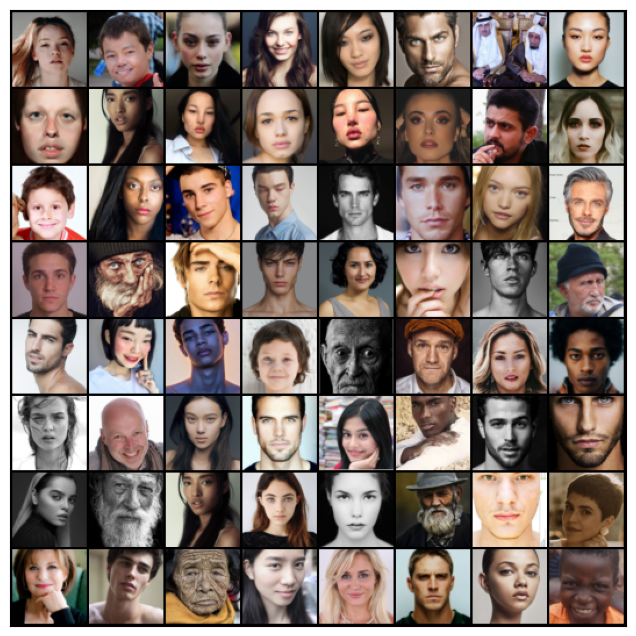

In [14]:
show_batch(train_dl)

In [15]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    return torch.device('mps')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [16]:
device = get_default_device()
device

device(type='mps')

In [17]:
train_dl = DeviceDataLoader(train_dl, device)

In [18]:
import torch.nn as nn

In [19]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [20]:
discriminator = to_device(discriminator, device)

In [21]:
latent_size = 128

In [22]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([256, 3, 64, 64])


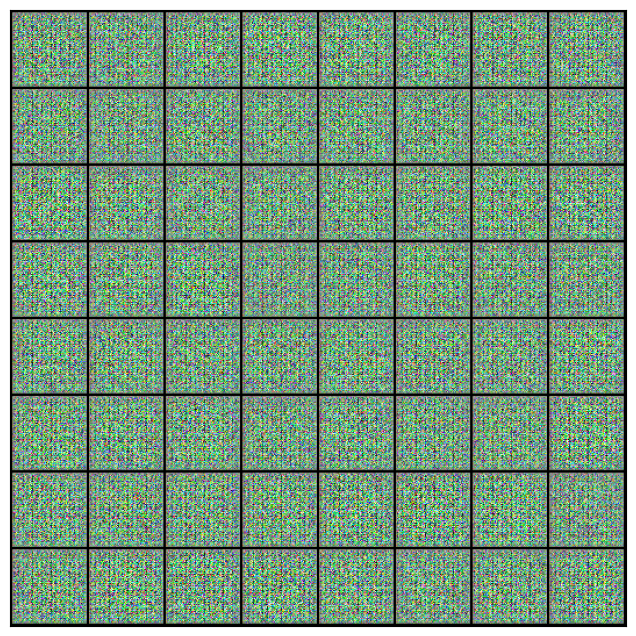

In [23]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [24]:
generator = to_device(generator, device)

In [25]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [26]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [27]:
from torchvision.utils import save_image

In [28]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [29]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [30]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


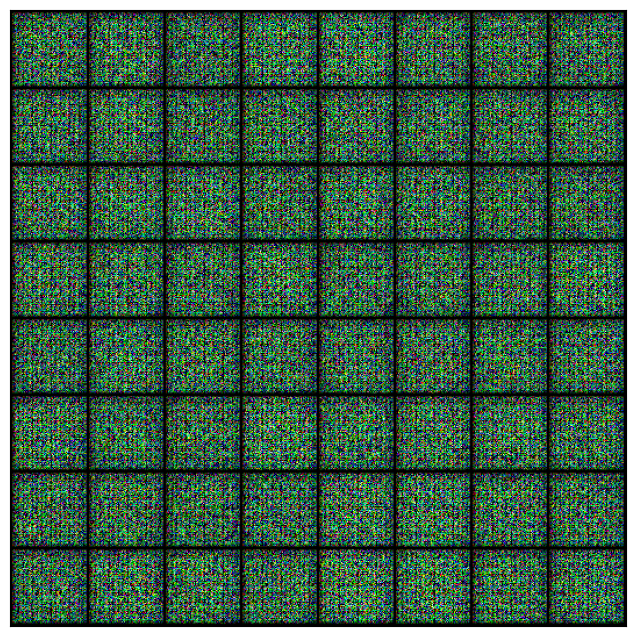

In [31]:
save_samples(0, fixed_latent)

In [32]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [33]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [48]:
lr = 0.0002
epochs = 50

In [49]:
history = fit(epochs, lr)

  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [1/50], loss_g: 3.5166, loss_d: 0.7058, real_score: 0.5433, fake_score: 0.0150
Saving generated-images-0001.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [2/50], loss_g: 2.0939, loss_d: 0.6985, real_score: 0.6196, fake_score: 0.0856
Saving generated-images-0002.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [3/50], loss_g: 5.8777, loss_d: 0.5905, real_score: 0.9333, fake_score: 0.3757
Saving generated-images-0003.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [4/50], loss_g: 2.5682, loss_d: 0.8113, real_score: 0.8368, fake_score: 0.3944
Saving generated-images-0004.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [5/50], loss_g: 3.9473, loss_d: 0.3095, real_score: 0.8863, fake_score: 0.1561
Saving generated-images-0005.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [6/50], loss_g: 2.9749, loss_d: 0.4097, real_score: 0.7398, fake_score: 0.0624
Saving generated-images-0006.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [7/50], loss_g: 4.1950, loss_d: 0.2620, real_score: 0.9802, fake_score: 0.1951
Saving generated-images-0007.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [8/50], loss_g: 2.8153, loss_d: 0.8697, real_score: 0.4746, fake_score: 0.0136
Saving generated-images-0008.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [9/50], loss_g: 4.5245, loss_d: 0.1905, real_score: 0.9344, fake_score: 0.1084
Saving generated-images-0009.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [10/50], loss_g: 3.9317, loss_d: 0.2063, real_score: 0.9080, fake_score: 0.0966
Saving generated-images-0010.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [11/50], loss_g: 4.6318, loss_d: 0.4031, real_score: 0.9397, fake_score: 0.2606
Saving generated-images-0011.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [12/50], loss_g: 3.2892, loss_d: 0.2192, real_score: 0.9149, fake_score: 0.1068
Saving generated-images-0012.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [13/50], loss_g: 0.1374, loss_d: 2.0533, real_score: 0.1961, fake_score: 0.0010
Saving generated-images-0013.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [14/50], loss_g: 4.4399, loss_d: 0.2395, real_score: 0.9142, fake_score: 0.1241
Saving generated-images-0014.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [15/50], loss_g: 4.5474, loss_d: 0.2411, real_score: 0.9595, fake_score: 0.1690
Saving generated-images-0015.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [16/50], loss_g: 2.5510, loss_d: 0.6670, real_score: 0.5681, fake_score: 0.0040
Saving generated-images-0016.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [17/50], loss_g: 2.1964, loss_d: 1.0973, real_score: 0.5014, fake_score: 0.1145
Saving generated-images-0017.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [18/50], loss_g: 3.7200, loss_d: 0.3751, real_score: 0.8435, fake_score: 0.1526
Saving generated-images-0018.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [19/50], loss_g: 2.2519, loss_d: 0.2486, real_score: 0.9006, fake_score: 0.1198
Saving generated-images-0019.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [20/50], loss_g: 5.7135, loss_d: 0.3813, real_score: 0.9568, fake_score: 0.2621
Saving generated-images-0020.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [21/50], loss_g: 2.2543, loss_d: 0.3949, real_score: 0.7718, fake_score: 0.0924
Saving generated-images-0021.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [22/50], loss_g: 4.7887, loss_d: 0.3377, real_score: 0.9271, fake_score: 0.2042
Saving generated-images-0022.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [23/50], loss_g: 3.6157, loss_d: 0.4043, real_score: 0.8246, fake_score: 0.1579
Saving generated-images-0023.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [24/50], loss_g: 4.5960, loss_d: 0.3967, real_score: 0.9378, fake_score: 0.2450
Saving generated-images-0024.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [25/50], loss_g: 1.0010, loss_d: 0.5127, real_score: 0.6497, fake_score: 0.0179
Saving generated-images-0025.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [26/50], loss_g: 3.2040, loss_d: 0.3626, real_score: 0.7809, fake_score: 0.0689
Saving generated-images-0026.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [27/50], loss_g: 2.5204, loss_d: 0.6094, real_score: 0.6816, fake_score: 0.1351
Saving generated-images-0027.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [28/50], loss_g: 3.1219, loss_d: 0.2694, real_score: 0.8300, fake_score: 0.0618
Saving generated-images-0028.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [29/50], loss_g: 2.8935, loss_d: 4.2656, real_score: 0.0565, fake_score: 0.0007
Saving generated-images-0029.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [30/50], loss_g: 4.1633, loss_d: 0.3547, real_score: 0.9055, fake_score: 0.2060
Saving generated-images-0030.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [31/50], loss_g: 5.1098, loss_d: 0.3721, real_score: 0.9837, fake_score: 0.2757
Saving generated-images-0031.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [32/50], loss_g: 3.8218, loss_d: 0.2112, real_score: 0.9593, fake_score: 0.1384
Saving generated-images-0032.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [33/50], loss_g: 3.9316, loss_d: 0.8433, real_score: 0.8390, fake_score: 0.4186
Saving generated-images-0033.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [34/50], loss_g: 3.1579, loss_d: 0.5061, real_score: 0.8208, fake_score: 0.2098
Saving generated-images-0034.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [35/50], loss_g: 2.4958, loss_d: 0.3135, real_score: 0.8017, fake_score: 0.0567
Saving generated-images-0035.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [36/50], loss_g: 3.7849, loss_d: 0.1882, real_score: 0.9151, fake_score: 0.0844
Saving generated-images-0036.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [37/50], loss_g: 3.7844, loss_d: 0.1206, real_score: 0.9417, fake_score: 0.0555
Saving generated-images-0037.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [38/50], loss_g: 2.9786, loss_d: 0.5995, real_score: 0.8171, fake_score: 0.2559
Saving generated-images-0038.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [39/50], loss_g: 5.7194, loss_d: 0.6078, real_score: 0.9302, fake_score: 0.3711
Saving generated-images-0039.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [40/50], loss_g: 3.9578, loss_d: 0.2203, real_score: 0.9266, fake_score: 0.1208
Saving generated-images-0040.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [41/50], loss_g: 5.0008, loss_d: 0.1576, real_score: 0.9514, fake_score: 0.0942
Saving generated-images-0041.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [42/50], loss_g: 2.6904, loss_d: 0.2186, real_score: 0.8642, fake_score: 0.0503
Saving generated-images-0042.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [43/50], loss_g: 3.0793, loss_d: 0.3397, real_score: 0.7806, fake_score: 0.0611
Saving generated-images-0043.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [44/50], loss_g: 3.7565, loss_d: 0.1439, real_score: 0.9099, fake_score: 0.0424
Saving generated-images-0044.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [45/50], loss_g: 3.0777, loss_d: 0.1283, real_score: 0.9444, fake_score: 0.0639
Saving generated-images-0045.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [46/50], loss_g: 4.9408, loss_d: 0.2479, real_score: 0.9515, fake_score: 0.1650
Saving generated-images-0046.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [47/50], loss_g: 4.4517, loss_d: 0.3383, real_score: 0.9205, fake_score: 0.2022
Saving generated-images-0047.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [48/50], loss_g: 4.2905, loss_d: 0.1431, real_score: 0.9608, fake_score: 0.0914
Saving generated-images-0048.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [49/50], loss_g: 4.3649, loss_d: 0.1333, real_score: 0.9518, fake_score: 0.0741
Saving generated-images-0049.png


  0%|          | 0/29 [00:00<?, ?it/s]

/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/opt/miniconda3/envs/env_pytorch/lib/python3.12/site-packages/PIL/Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch [50/50], loss_g: 0.2064, loss_d: 3.6788, real_score: 0.0513, fake_score: 0.0006
Saving generated-images-0050.png


In [36]:
losses_g, losses_d, real_scores, fake_scores = history

In [37]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [38]:
from IPython.display import Image

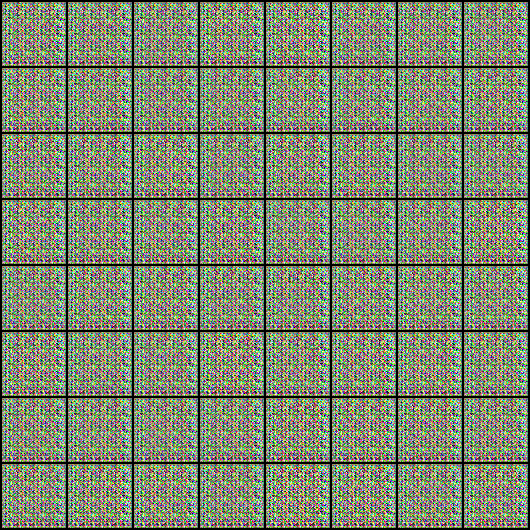

In [39]:
Image('./generated/generated-images-0001.png')

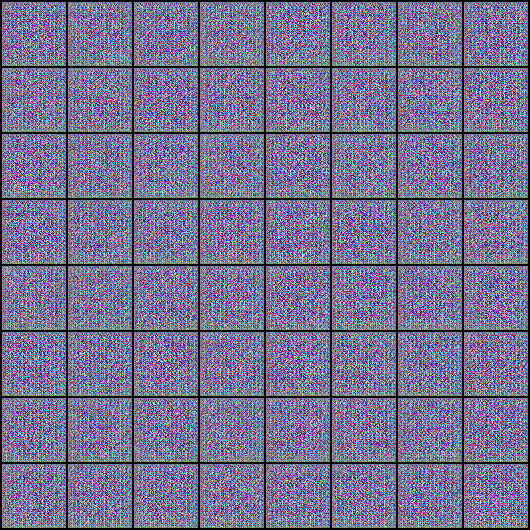

In [40]:
Image('./generated/generated-images-0002.png')

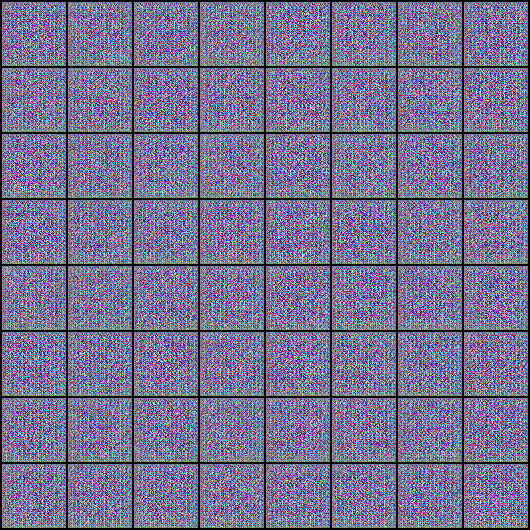

In [41]:
Image('./generated/generated-images-0003.png')

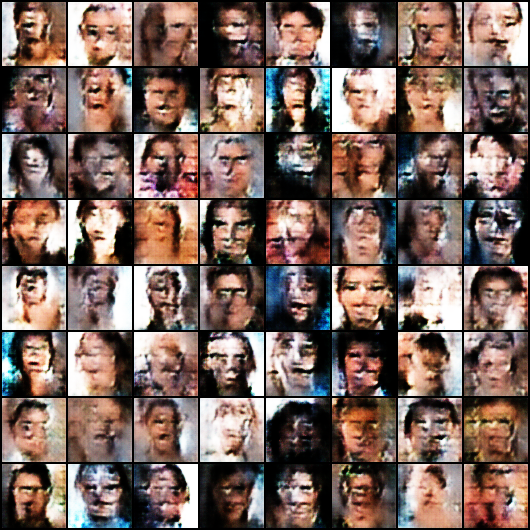

In [55]:
Image('./generated/generated-images-0009.png')

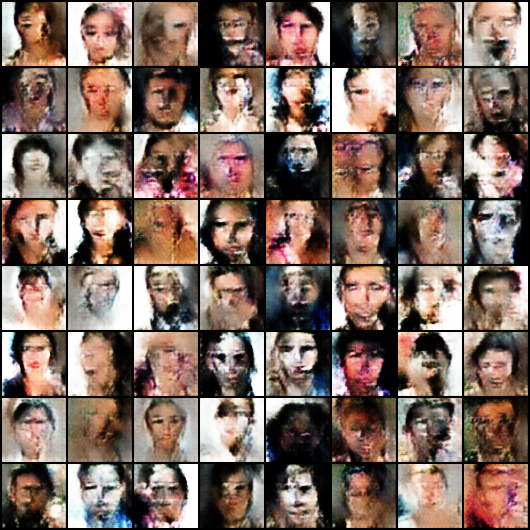

In [56]:
Image('./generated/generated-images-0015.png')

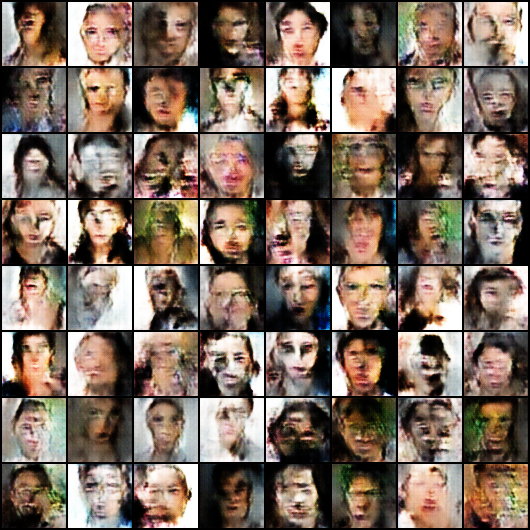

In [57]:
Image('./generated/generated-images-0020.png')

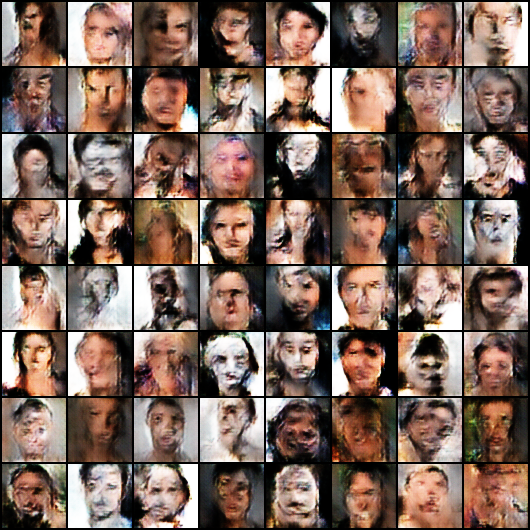

In [61]:
Image('./generated/generated-images-0025.png')

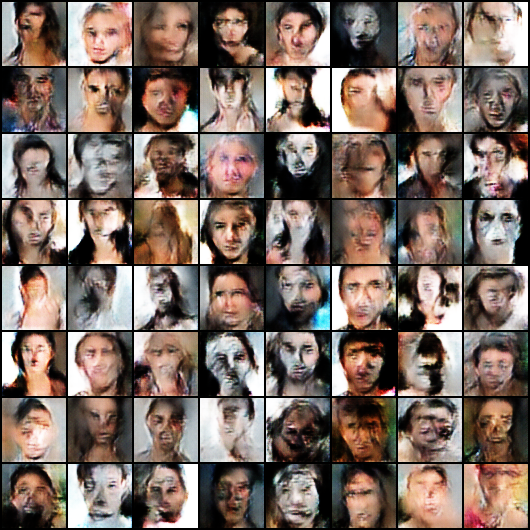

In [62]:
Image('./generated/generated-images-0035.png')

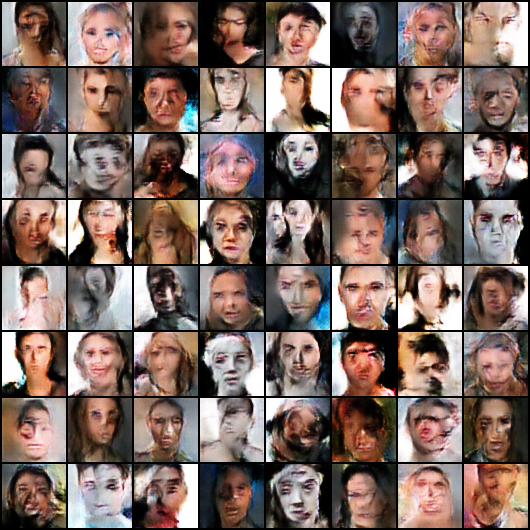

In [63]:
Image('./generated/generated-images-0050.png')